# Regressão Softmax com dados do MNIST

## Objetivo

O objetivo deste notebook é ilustrar o uso de praticamente a mesma rede desenvolvida para a classificação das flores Íris, porém agora com o problema de classificação de dígitos manuscritos utilizando o dataset MNIST.
As principais diferenças são:
- tipo do dado, agora imagem com muito atributos: 28 x 28 pixels
- número de amostras, muito maior, 60 mil
Neste exercício será possível a interpretação do significado dos parâmetros treinados

## Importação das bibliotecas

In [1]:
! pip install Pillow

In [2]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import torch
from torch.autograd import Variable

import torchvision

## Carregamento dos dados do MNIST

In [3]:
! git clone https://github.com/vcasadei/MNIST.git

Cloning into 'MNIST'...
remote: Enumerating objects: 10, done.
remote: Total 10 (delta 0), reused 0 (delta 0), pack-reused 10 (from 1)
Receiving objects: 100% (10/10), 11.01 MiB | 17.64 MiB/s, done.
Resolving deltas: 100% (2/2), done.


In [4]:
!ls MNIST

processed  raw


In [5]:
dataset_dir = 'MNIST/'

x_train, y_train = torch.load(dataset_dir + 'processed/training.pt')

print("Amostras de treinamento:", x_train.size(0))

print("\nDimensões dos dados das imagens:   ", x_train.size())
print("Valores mínimo e máximo dos pixels:", torch.min(x_train), torch.max(x_train))
print("Tipo dos dados das imagens:        ", type(x_train))
print("Tipo das classes das imagens:      ", type(y_train))

Amostras de treinamento: 60000

Dimensões dos dados das imagens:    torch.Size([60000, 28, 28])
Valores mínimo e máximo dos pixels: tensor(0, dtype=torch.uint8) tensor(255, dtype=torch.uint8)
Tipo dos dados das imagens:         <class 'torch.Tensor'>
Tipo das classes das imagens:       <class 'torch.Tensor'>


### Carregamento, normalização e seleção dos dados do MNIST

Neste exemplo utilizaremos todas as amostras de treinamento.

In [6]:
x_train = x_train.float()

x_train = x_train / 255.

if False:
    #n_samples_train = 1000

    x_train = x_train[:n_samples_train]
    y_train = y_train[:n_samples_train]

print("Amostras de treinamento:", x_train.size(0))

print("\nDimensões dos dados das imagens:   ", x_train.size())
print("Valores mínimo e máximo dos pixels:", torch.min(x_train), torch.max(x_train))
print("Tipo dos dados das imagens:        ", type(x_train))
print("Tipo das classes das imagens:      ", type(y_train))

Amostras de treinamento: 60000

Dimensões dos dados das imagens:    torch.Size([60000, 28, 28])
Valores mínimo e máximo dos pixels: tensor(0.) tensor(1.)
Tipo dos dados das imagens:         <class 'torch.Tensor'>
Tipo das classes das imagens:       <class 'torch.Tensor'>


### Visualizando os dados

(np.float64(-0.5), np.float64(232.5), np.float64(87.5), np.float64(-0.5))

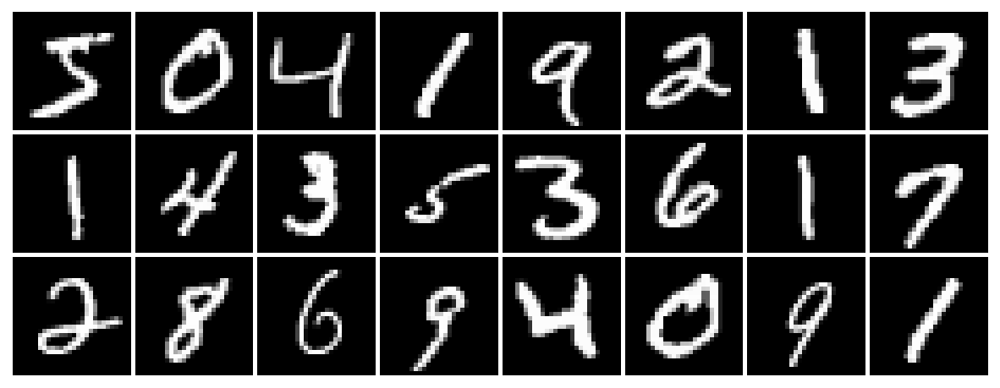

In [7]:
n_samples = 24

# cria um grid com as imagens
grid = torchvision.utils.make_grid(x_train[:n_samples].unsqueeze(dim=1), pad_value=1.0, padding=1)

plt.figure(figsize=(15, 10))
plt.imshow(grid.numpy().transpose(1, 2, 0))
plt.axis('off')

### Visualizando uma imagem com o matplotlib

class: tensor(5)


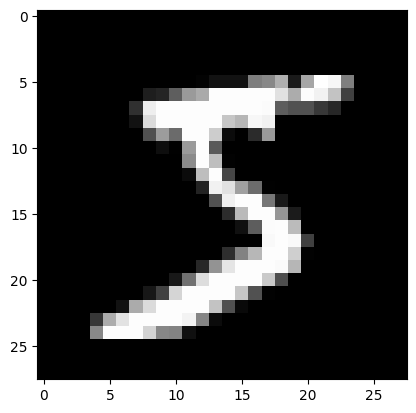

In [8]:
image  = x_train[0]
target = y_train[0]

plt.imshow(image.numpy(), cmap='gray')
print('class:', target)

## Modelo

In [36]:
model = torch.nn.Linear(28*28, 10) # 28*28 atributos de entrada e 10 neurônios na sáida

### Testando um predict com poucas amostras

In [37]:
xin = x_train[:5].view(-1,28*28)
score = model(Variable(xin))
score

tensor([[ 0.2109, -0.2544,  0.2400,  0.0963,  0.0353, -0.2291,  0.2349,  0.2176,
         -0.1936, -0.1674],
        [ 0.1902, -0.2349, -0.0121,  0.1744,  0.1769, -0.0195,  0.0186,  0.2119,
          0.1221,  0.0436],
        [ 0.0641, -0.2052,  0.3363,  0.0240,  0.1758, -0.0059,  0.0964,  0.2709,
         -0.2592,  0.0965],
        [ 0.1862, -0.1464,  0.2668,  0.1262,  0.0926,  0.0023, -0.0970,  0.0686,
          0.0783, -0.1400],
        [ 0.2204, -0.2651,  0.2389,  0.1314,  0.1668,  0.1854, -0.2375,  0.2709,
          0.1547, -0.0504]], grad_fn=<AddmmBackward0>)

In [38]:
import torch.nn.functional as F

prob = F.softmax(score,dim=1)
print(prob)

tensor([[0.1188, 0.0746, 0.1223, 0.1060, 0.0997, 0.0765, 0.1217, 0.1196, 0.0793,
         0.0814],
        [0.1122, 0.0733, 0.0916, 0.1104, 0.1107, 0.0910, 0.0945, 0.1146, 0.1048,
         0.0969],
        [0.0989, 0.0756, 0.1299, 0.0951, 0.1106, 0.0923, 0.1022, 0.1217, 0.0716,
         0.1022],
        [0.1143, 0.0820, 0.1239, 0.1077, 0.1041, 0.0951, 0.0861, 0.1016, 0.1026,
         0.0825],
        [0.1130, 0.0696, 0.1152, 0.1034, 0.1071, 0.1092, 0.0715, 0.1189, 0.1059,
         0.0862]], grad_fn=<SoftmaxBackward0>)


In [39]:
max_prob, max_classe = torch.max(prob, dim=1)
print(max_prob)
print(max_classe)

tensor([0.1223, 0.1146, 0.1299, 0.1239, 0.1189], grad_fn=<MaxBackward0>)
tensor([2, 7, 2, 2, 7])


## Treinamento

### Inicialização dos parâmetros

In [40]:
epochs = 1500
learningRate = 0.5

# Utilizaremos CrossEntropyLoss como função de perda
criterion = torch.nn.CrossEntropyLoss()

# Gradiente descendente
optimizer = torch.optim.SGD(model.parameters(), lr=learningRate)

### Visualização do grafo computacional da perda (loss)

In [14]:
!pip install graphviz
!pip install git+https://github.com/szagoruyko/pytorchviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.1/47.1 kB 1.7 MB/s eta 0:00:00
  Cloning https://github.com/szagoruyko/pytorchviz to /tmp/pip-req-build-ed502brh
  Running command git clone --filter=blob:none --quiet https://github.com/szagoruyko/pytorchviz /tmp/pip-req-build-ed502brh
  Resolved https://github.com/szagoruyko/pytorchviz to commit 5cf04c13e601366f6b9cf5939b5af5144d55b887
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for torchviz: filename=torchviz-0.0.2-py3-none-any.whl size=5038 sha256=cfa9ca1c90023ac46dd234b115ca92a04af9548473635ae4f951f533a8d58fed
  Stored in directory: /tmp/pip-ephem-wheel-cache-q2wdfkop/wheels/63/59/c1/3342e0bca82db7c512109b8da472d40be5c95cca7ce5363332
Successfully built torchviz


In [41]:
from torchviz import make_dot, make_dot_from_trace
y_pred = model(Variable(x_train.view(-1,28*28)))
loss = criterion(y_pred, Variable(y_train))
loss


tensor(2.3065, grad_fn=<NllLossBackward0>)

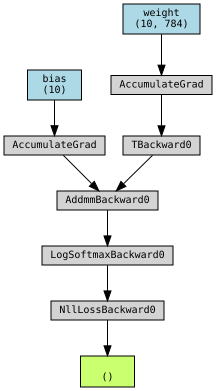

In [42]:
p = make_dot(loss, dict(model.named_parameters()))
p

### Laço de treinamento dos pesos

In [43]:
import numpy
losses = []
zs = []

for i in range(epochs):
    # Transforma a entrada para uma dimensão
    inputs = Variable(x_train.view(-1, 28 * 28))
    # Predict da rede
    outputs = model(inputs)

    # z0 a z9
    zs.append(outputs[1].detach().numpy())

    # calcula a perda
    loss = criterion(outputs, Variable(y_train))

    # zero, backpropagation, ajusta parâmetros pelo gradiente descendente
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    losses.append(loss.item())

    _, predicts = torch.max(outputs, 1)

    y_pred = predicts.data
    accuracy = (y_pred.numpy() == y_train.numpy()).mean()


In [44]:
print('Final loss:', loss.item())

Final loss: 0.27418336272239685


### Visualizando gráfico de perda durante o treinamento

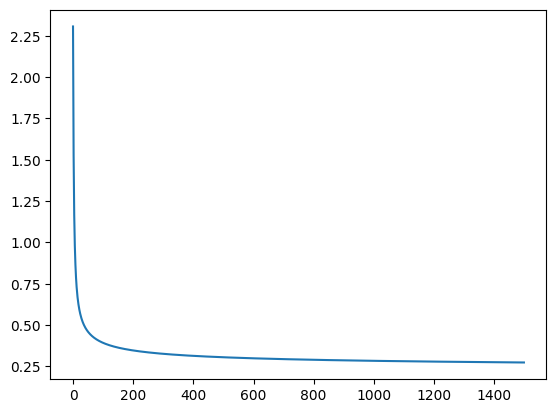

In [45]:
plt.plot(losses)

## Avaliação

### Acurácia tanto no conjunto de treinamento como no conjunto de testes

In [46]:
def predict(model, input_data):
    outputs = model(Variable(input_data))
    _, predicts = torch.max(outputs, 1)

    return predicts.data

y_pred = predict(model, x_train.view(-1, 28*28))
accuracy = (y_pred.numpy() == y_train.numpy()).mean()
print('Accuracy:', accuracy)

Accuracy: 0.92395


### Matriz de confusão com dados de treinamento e teste

In [47]:
print('Matriz de confusão:')
pd.crosstab(y_pred.numpy(), y_train.numpy())

Matriz de confusão:


col_0,0,1,2,3,4,5,6,7,8,9
row_0,,,,,,,,,,
0,5730,1,31,18,14,66,32,23,29,32
1,1,6556,64,28,32,30,14,35,124,32
2,21,30,5351,125,31,44,43,72,56,18
3,10,21,88,5501,7,172,2,21,139,78
4,13,6,83,6,5460,64,49,52,30,165
5,44,30,28,203,3,4745,68,9,142,35
6,43,7,72,27,59,93,5671,3,47,2
7,7,15,80,61,16,21,4,5855,15,169
8,48,66,134,104,35,130,33,13,5197,47


## Visualizando a matriz de pesos treinados

Observe que a matriz de peso treinado para cada classe mostra a importância dos pesos associados aos caracteres de cada classe.

weights: torch.Size([10, 784])
bias:    torch.Size([10])


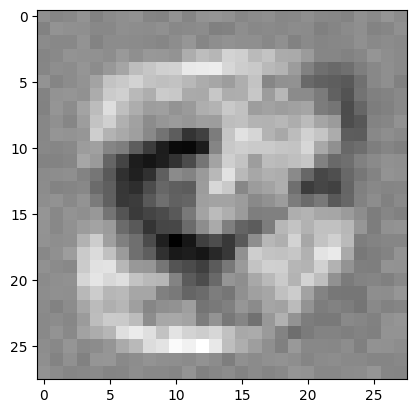

In [48]:
weights = model.state_dict()['weight']
print('weights:', weights.shape)

bias = model.state_dict()['bias']
print('bias:   ', bias.shape)

# Visualizando pesos da classe 3
plt.imshow(weights[3, :].numpy().reshape((28,28)),cmap = 'gray')
plt.show()

### Visualizando os pesos de todas as classes

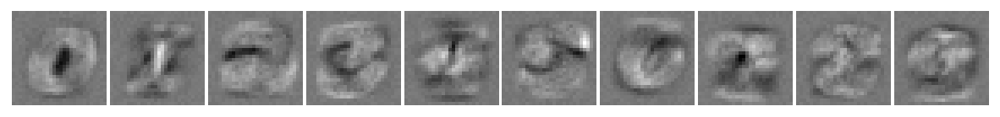

In [49]:
# cria um grid com as imagens
grid = torchvision.utils.make_grid(weights.view(-1, 1, 28, 28), normalize=True, pad_value=1.0, padding=1, nrow=10)

plt.figure(figsize=(15, 10))
plt.imshow(grid.numpy().transpose(1, 2, 0))
plt.axis('off');

### Diagrama da regressão softmax com visualização dos pesos W

![alt text](https://raw.githubusercontent.com/vcasadei/images/master/RegressaoSoftmaxArgmaxNMIST.png)

# Atividades

## Exercícios

- 1) Insira código no laço do treinamento para que no final de cada época,
     seja impresso: o número da época e a perda e a acurácia

In [50]:
# Resposta exercício 1
import numpy
losses = []
zs = []

for i in range(epochs):
    # Transforma a entrada para uma dimensão
    inputs = Variable(x_train.view(-1, 28 * 28))
    # Predict da rede
    outputs = model(inputs)

    # z0 a z9
    zs.append(outputs[1].detach().numpy())

    # calcula a perda
    loss = criterion(outputs, Variable(y_train))

    # zero, backpropagation, ajusta parâmetros pelo gradiente descendente
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    losses.append(loss.item())

    _, predicts = torch.max(outputs, 1)

    y_pred = predicts.data
    accuracy = (y_pred.numpy() == y_train.numpy()).mean()
    print(f"Época - {i+1}\n Perda - {loss.data}\n Acurácia - {accuracy}")

Época - 1
 Perda - 0.2741681635379791
 Acurácia - 0.92395
Época - 2
 Perda - 0.2741530239582062
 Acurácia - 0.92395
Época - 3
 Perda - 0.27413785457611084
 Acurácia - 0.92395
Época - 4
 Perda - 0.2741226851940155
 Acurácia - 0.9239333333333334
Época - 5
 Perda - 0.27410757541656494
 Acurácia - 0.9239333333333334
Época - 6
 Perda - 0.274092435836792
 Acurácia - 0.9239333333333334
Época - 7
 Perda - 0.2740773558616638
 Acurácia - 0.9239333333333334
Época - 8
 Perda - 0.27406224608421326
 Acurácia - 0.92395
Época - 9
 Perda - 0.2740471661090851
 Acurácia - 0.92395
Época - 10
 Perda - 0.2740321159362793
 Acurácia - 0.9239666666666667
Época - 11
 Perda - 0.2740170955657959
 Acurácia - 0.9239833333333334
Época - 12
 Perda - 0.2740020155906677
 Acurácia - 0.9239833333333334
Época - 13
 Perda - 0.2739870250225067
 Acurácia - 0.9239833333333334
Época - 14
 Perda - 0.2739720046520233
 Acurácia - 0.9239666666666667
Época - 15
 Perda - 0.2739570438861847
 Acurácia - 0.9239833333333334
Época - 16
 

- 2) Insira código no laço do treinamento para visualização dos valores dos gradientes referentes à classe do dígito 4, no final de cada época.

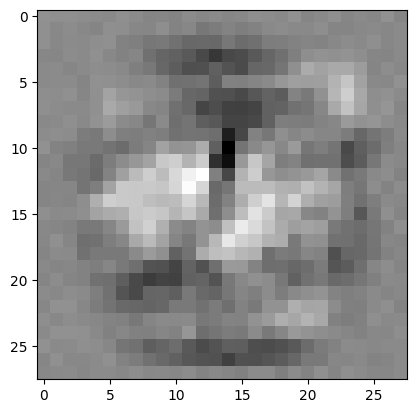

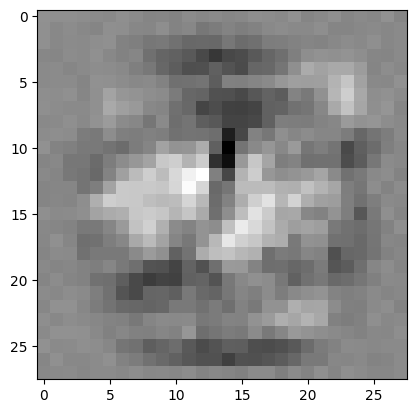

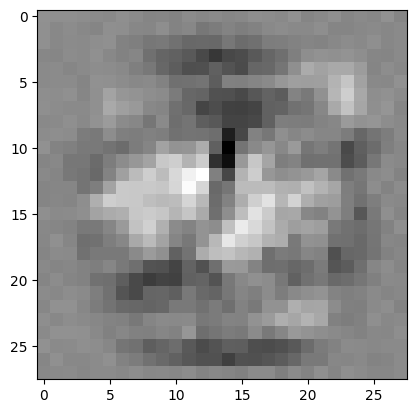

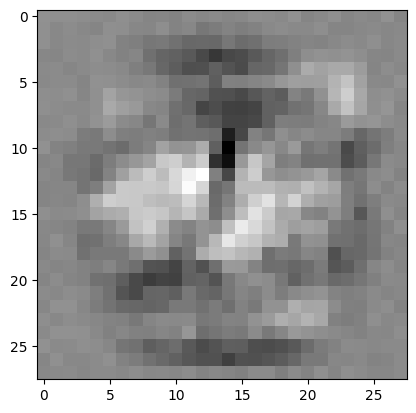

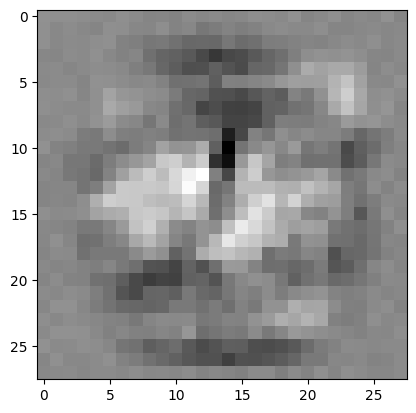

...

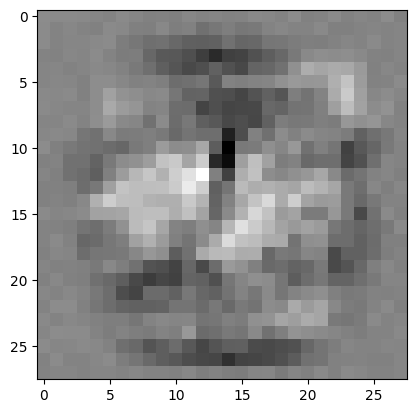

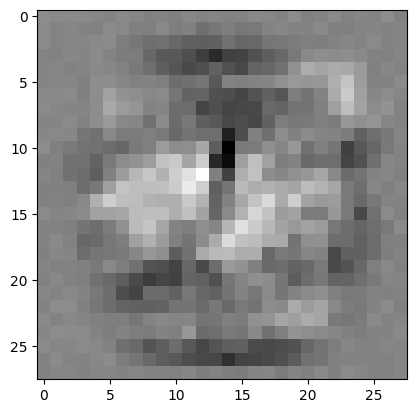

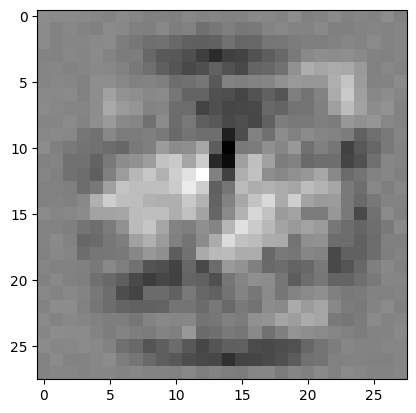

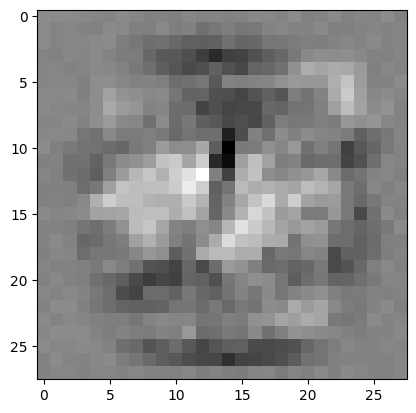

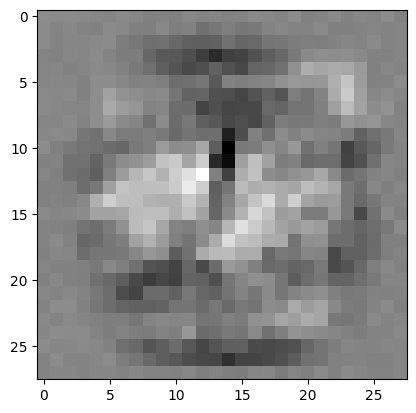

In [51]:
# Resposta exercício 2

import numpy
losses = []
zs = []

for i in range(epochs):
    # Transforma a entrada para uma dimensão
    inputs = Variable(x_train.view(-1, 28 * 28))
    # Predict da rede
    outputs = model(inputs)

    # z0 a z9
    zs.append(outputs[1].detach().numpy())

    # calcula a perda
    loss = criterion(outputs, Variable(y_train))

    # zero, backpropagation, ajusta parâmetros pelo gradiente descendente
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    losses.append(loss.item())

    _, predicts = torch.max(outputs, 1)

    y_pred = predicts.data
    accuracy = (y_pred.numpy() == y_train.numpy()).mean()

    #visualização dos pesos para a classe 4
    weights = model.state_dict()['weight']
    bias = model.state_dict()['bias']
    plt.imshow(weights[4, :].numpy().reshape((28,28)),cmap = 'gray')
    plt.show()


<details>
<summary>Mostrar Resultado</summary>

```python
losses = []
import numpy

import numpy
zs = []

for i in range(epochs):
    # Transforma a entrada para uma dimensão
    inputs = Variable(x_train.view(-1, 28 * 28))
    # Predict da rede
    outputs = model(inputs)
    
    # z0 a z9
    zs.append(outputs[1].detach().numpy())

    # calcula a perda
    loss = criterion(outputs, Variable(y_train))

    # zero, backpropagation, ajusta parâmetros pelo gradiente descendente
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    losses.append(loss.item())
    
    _, predicts = torch.max(outputs, 1)
    
    y_pred = predicts.data
    accuracy = (y_pred.numpy() == y_train.numpy()).mean()
    
    print('Epoch[{}/{}], loss: {:.6f}, acc: {:.6f}'
              .format(i+1, epochs, loss.data, accuracy))
    
    weights = model.state_dict()['weight']
    print('weights:', weights.shape)

    bias = model.state_dict()['bias']
    print('bias:   ', bias.shape)

    # Visualizando pesos da classe 3
    plt.imshow(weights[4, :].numpy().reshape((28,28)),cmap = 'gray')
    plt.show()
```

</details>

## Perguntas

1. Qual é o shape da matriz de entrada na rede? [60000,28*28]
2. Qual é o shape da saída da rede? [60000,10]
3. Qual é o número total de parâmetros da rede, incluindo o bias? 784*10 + 10 = 7850


# Aprendizados


* Utilização da regressão logística para rede neural em imagens
* A função de custo para a regressão logística é a entropia
* O softmax nos retorna o valor de probabilidade acerca de cada score de retorno das camadas
* Como calcular a acurácia para analisar se o modelo está com uma boa assertividade e generalização para os dados de teste
* A medida que aumentamos a quantidade de pixels na entrada também aumentamos a quantidade de pesos que serão treinados
* É necessário converter a matriz que representa as imagens em uma dimensão de linha